|Assignment 1 | Intro to Deep Learning |
|--- | ------ |
| Name | Disha Gandhi |
| EID | dsg2258  |

In [83]:
import torch
import numpy as np
from torch import nn
import matplotlib.pyplot as plt
from torch.autograd import Variable
from IPython import display
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset

## Question 1

### 1.1   
#### For the function y = f(x) = w.x + b, where w=[2,1] and b=3, find the partial derivates of y w.r.t the components of x (i.e.: dy/dx1 and dy/dx2) at x = [4,2] both on paper and using PyTorch.

In [73]:
x=torch.tensor([4,2], dtype=torch.float, requires_grad=True)
w=torch.tensor([2,1],dtype=torch.float)
b=torch.tensor(3,dtype=torch.float)
y=torch.matmul(w.T,x) + b
y.backward()
x.grad

tensor([2., 1.])

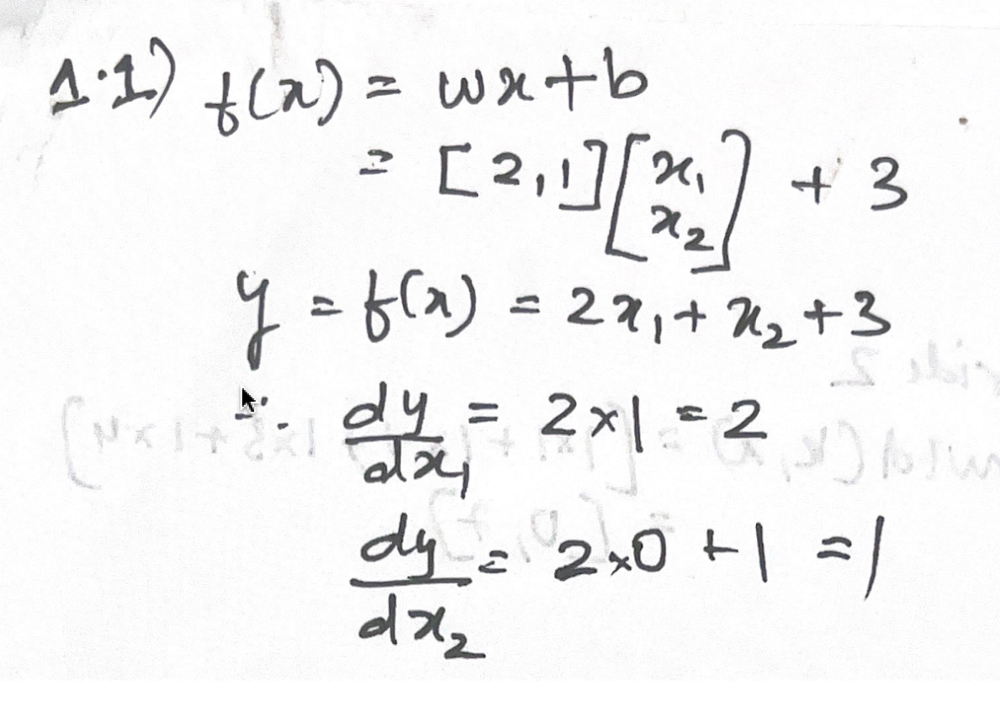

In [65]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/1.1.png")


### 1.2    
#### For a model y = f(x), the predicted and true values are as follows: 
#### y_true = [0,1,1,0]
#### y_pred = [0.1,0.95,1.10,0.2]
#### Find the mean squared error both on paper and using PyTorch. In PyTorch, solve it using an inbuilt function and also by defining your own squared error function.

In [90]:
y_true=torch.tensor([0,1,1,0],dtype=torch.float)
y_pred=torch.tensor([0.1,0.95,1.10,0.2])

In [93]:
def mse_function(y_true,y_pred):
    mse=torch.mean((y_true-y_pred)**2)
    return mse

In [76]:
mse=torch.nn.MSELoss()
mse_loss = mse(y_true, y_pred)
print("Mean Squared Error using inbuilt function is: ",mse_loss.item())
mse_loss = mse_function(y_true,y_pred)
print("Mean Squared Error using own defined function is:",mse_loss.item())

Mean Squared Error using inbuilt function is:  0.01562500186264515
Mean Squared Error using own defined function is: 0.01562500186264515


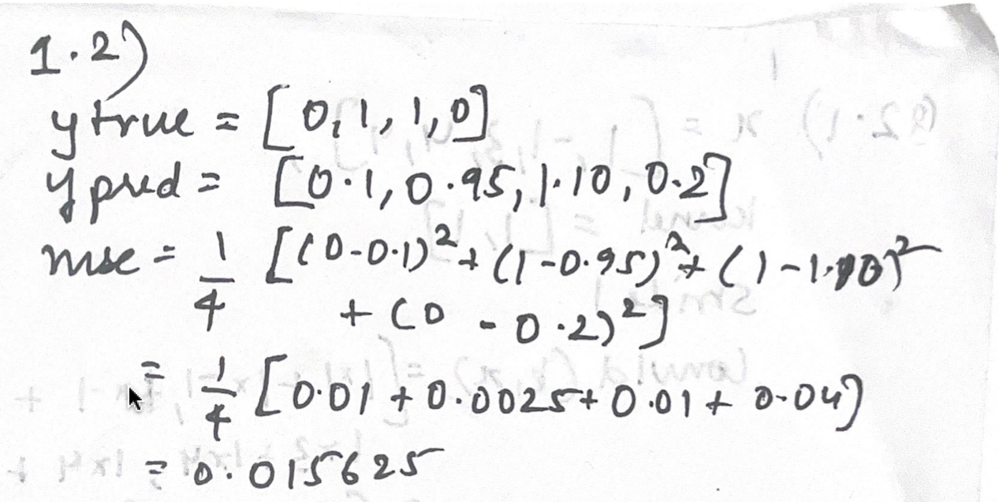

In [66]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/1.2.png")


### 1.3
#### You are given the following dataset (note that it describes an XOR function):
#### Assume that we fit a linear function, y = w.x + b to this dataset with w = [2,1] and b=3.
#### i) Find the mean squared error (loss) over this dataset for the above weights and bias.
#### ii) Which direction should the weights move in to decrease the loss by maximum amount? Find that direction both on paper and using PyTorch.
#### iii) For what values of w and b is the loss minimum? Solve on paper only.
#### Extra-credit: Can you solve for the optimum w and b using PyTorch? Hint: use gradient descent


In [91]:
x=torch.tensor([[0,0],[0,1],[1,0],[1,1]], dtype=torch.float)
w=torch.tensor([2,1], dtype=torch.float, requires_grad=True)
b=torch.tensor(3.0, requires_grad=True)
y_pred=torch.sum(w * x, 1) + b
y_true=torch.tensor([0,1,1,0], dtype=torch.float)
mse_loss = mse_function(y_true, y_pred)
print("Mean Squared Error for this dataset is: ", mse_loss.item())
mse_loss.backward()

Mean Squared Error for this dataset is:  17.5


In [88]:
w.grad

tensor([5.0000, 4.5000])

In [89]:
b.grad

tensor(8.)

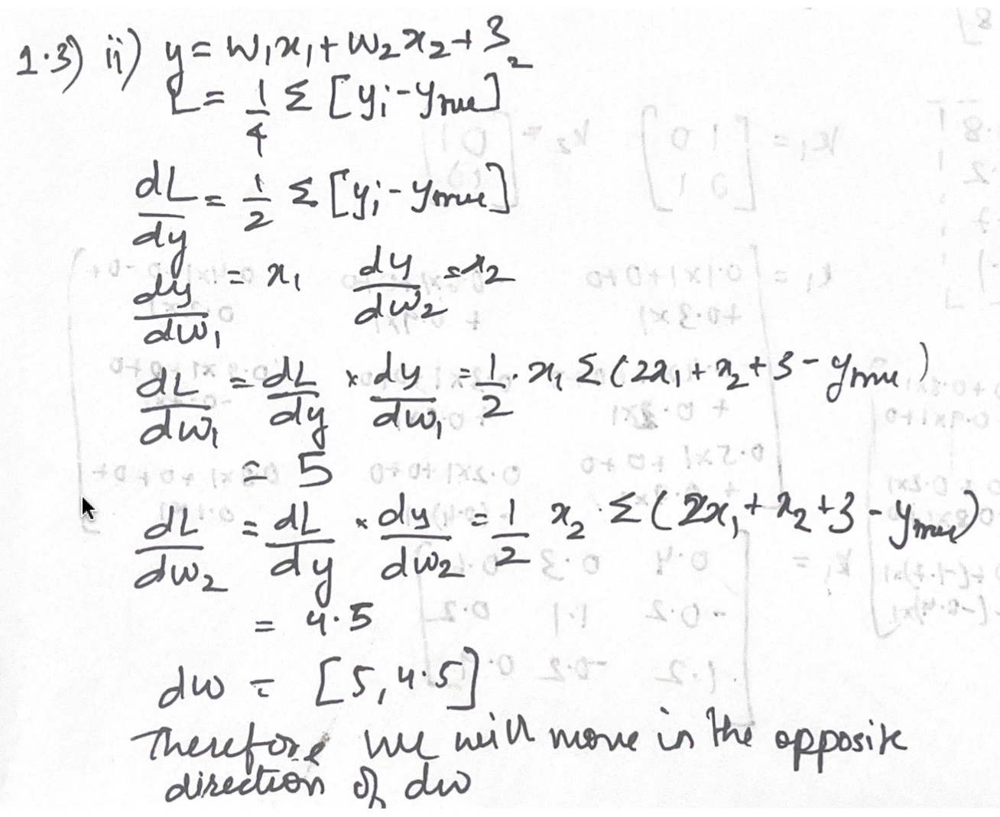

In [68]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/1.3.2.png")


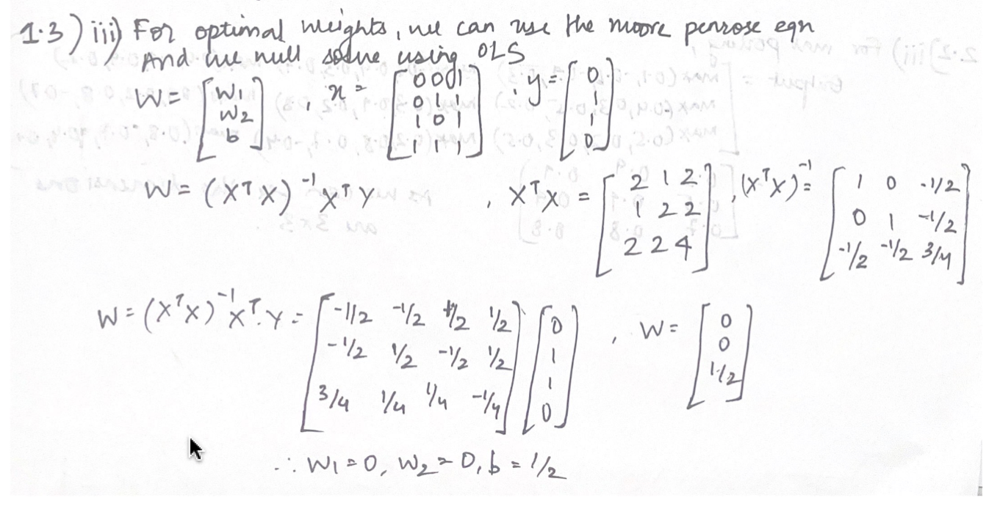

In [69]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/1.3.3.png")


**For Extra Credit**

In [94]:
x=torch.tensor([[0,0],[0,1],[1,0],[1,1]],dtype=torch.float)
w=torch.tensor([2,1],dtype=torch.float,requires_grad=True)
b=torch.tensor(3.0,requires_grad=True)

In [101]:
epochs = 500
learning_rate = 0.01
loss = []

for i in range(epochs):
    y_pred=torch.sum(w*x,1)+b
    mse_loss = mse_function(y_true, y_pred)
    mse_loss.backward()

    with torch.no_grad():
            w -= w.grad *learning_rate
            b -= b.grad * learning_rate
            w.grad.zero_()
            b.grad.zero_()

    #print(f"Epoch {i}/{epochs}: Loss: {MSE_Loss}")
    loss.append(mse_loss.item())

**Optimum values of w and b**

In [102]:
w

tensor([ 0.0043, -0.9957], requires_grad=True)

In [103]:
b

tensor(0.9949, requires_grad=True)

In [104]:
y_pred=torch.sum(w*x,1)+b
y_pred

tensor([ 3.4825e-03,  9.9920e-01,  9.9492e-01, -7.9536e-04],
       grad_fn=<AddBackward0>)

## Question 2

### 2.1

#### Given a 1-d input x=[1,-1,3,4,4] and a kernel=[1,1], find the 1-d convolution for stride=1 and stride=2. Solve both on paper and using pyTorch.


In [32]:
x = torch.tensor([1,-1,3,4,4], dtype=torch.float)
x = x.unsqueeze(0)
x = x.unsqueeze(0)
x = x.squeeze(0)

In [33]:
# stride = 1
cnn1d = nn.Conv1d(in_channels=1, out_channels=1, kernel_size=2,bias=False, stride=1)
cnn1d.weight.data=torch.tensor([1,1], dtype=torch.float, requires_grad=True)
cnn1d.weight.data=cnn1d.weight.data.unsqueeze(0).unsqueeze(0)
output_stride_1=cnn1d(x)
output_stride_1

tensor([[0., 2., 7., 8.]], grad_fn=<SqueezeBackward1>)

In [34]:
# stride = 2
cnn1d = nn.Conv1d(in_channels=1, out_channels=1, kernel_size=2,bias=False, stride=2)
cnn1d.weight.data=torch.tensor([1,1],dtype=torch.float, requires_grad=True)
cnn1d.weight.data=cnn1d.weight.data.unsqueeze(0).unsqueeze(0)
output_stride_2=cnn1d(x)
output_stride_2

tensor([[0., 7.]], grad_fn=<SqueezeBackward1>)

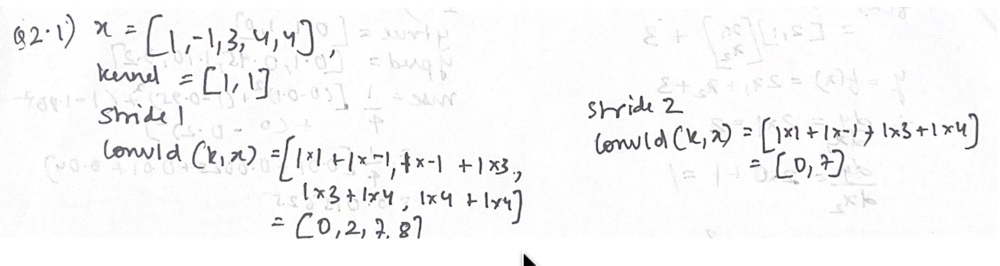

In [70]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/2.1.png")


### 2.2

#### You’re given the following grayscale image (any matrix in 2 dimensions is a grayscale image):
#### i) You’re given 2 2*2 filters (kernels): [[1,0],[0,1]] and [[0,1],[1,0]]. Find the output when the image is convolved using each filter with stride=1. Solve both on paper and by using pyTorch.
#### ii) What are the dimensions of each channel in (i)? What will be the dimensions of the output when stride=2?
#### iii)  The given image is a 2-d matrix. How can you convolve it so that the output channel has only one dimension?
#### iv) Perform a 2*2 max-pooling with stride=1 on the image both on paper and using PyTorch. What are the dimensions of the channel after max-pooling?
#### Extra Credit: If the size of the output channel after performing a 2X2 convolution (stride=1) and a 2X2 max-pooling (stride=1) is the same, why do you think we needed max-pooling when we could perform convolution to decrease the size of the image. Think in terms of the advantages that max-pooling may offer over convolution. When do you think a max-pooling operation may not be advantageous (and in fact may hurt the network)?

In [35]:
x=torch.tensor([[0.1,-0.6,0.4,0.8],[-0.4,0.3,0.9,0.2],[0.5,0.2,0.8,-0.7],[0.3,0.7,-0.4,0.1]], dtype=torch.float)
x=x.unsqueeze(0)
cnn2d=nn.Conv2d(in_channels=1, out_channels=2, kernel_size=(2,2),bias=False, stride=1)
cnn2d.weight.data=torch.tensor([[[1,0],[0,1]],[[0,1],[1,0]]], dtype=torch.float)
cnn2d.weight.data=cnn2d.weight.data.unsqueeze(1)
output_2d = cnn2d(x)
output_2d

tensor([[[ 0.4000,  0.3000,  0.6000],
         [-0.2000,  1.1000,  0.2000],
         [ 1.2000, -0.2000,  0.9000]],

        [[-1.0000,  0.7000,  1.7000],
         [ 0.8000,  1.1000,  1.0000],
         [ 0.5000,  1.5000, -1.1000]]], grad_fn=<SqueezeBackward1>)

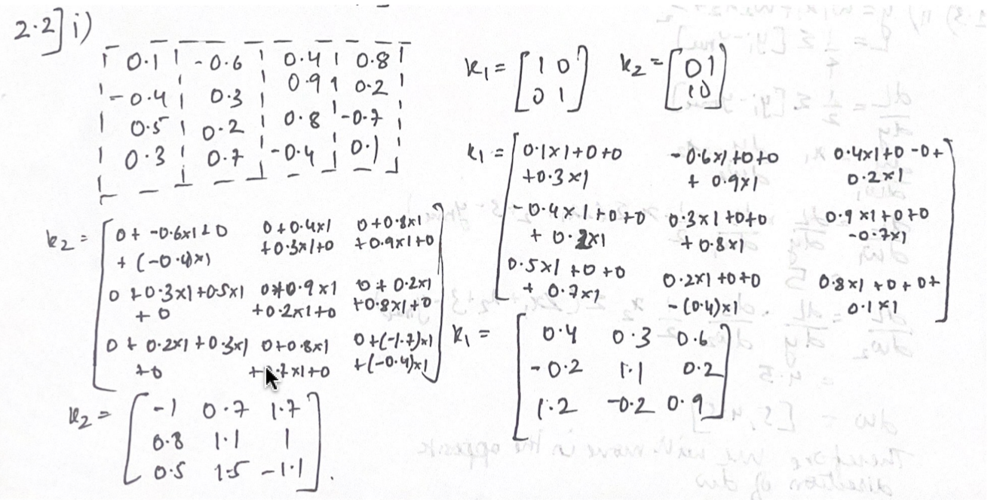

In [71]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/2.2.1.png")


In [37]:
print("The dimensions of each channel with stride 1 are: ",output_2d.shape[1:]) 

The dimensions of each channel with stride 1 are:  torch.Size([3, 3])


In [38]:
cnn2d=nn.Conv2d(in_channels=1, out_channels=2, kernel_size=(2,2),bias=False, stride=2)
cnn2d.weight.data=torch.tensor([[[1,0],[0,1]],[[0,1],[1,0]]], dtype=torch.float)
cnn2d.weight.data=cnn2d.weight.data.unsqueeze(1)
output_2d = cnn2d(x)
output_2d

tensor([[[ 0.4000,  0.6000],
         [ 1.2000,  0.9000]],

        [[-1.0000,  1.7000],
         [ 0.5000, -1.1000]]], grad_fn=<SqueezeBackward1>)

In [39]:
print("The dimensions of each channel with stride 2 are: ",output_2d.shape[1:]) 

The dimensions of each channel with stride 2 are:  torch.Size([2, 2])


To ensure that the output has only one dimension, we can use a kernel size of (1, 4) or (4, 1) when the input has dimensions of 4x4. This will limit the kernel to slide along only one dimension, resulting in a one-dimensional output. Therefore, it's important to ensure that the kernel is restricted to move along only one dimension to achieve a one-dimensional output.

In [40]:
x=torch.tensor([[0.1,-0.6,0.4,0.8],[-0.4,0.3,0.9,0.2],[0.5,0.2,0.8,-0.7],[0.3,0.7,-0.4,0.1]],dtype=torch.float)
kernel=torch.tensor([[1,-1,-1,1]], dtype=torch.float32)
conv=torch.nn.functional.conv2d(x.unsqueeze(0).unsqueeze(0), kernel.unsqueeze(0).unsqueeze(0), stride=1)
print(conv.squeeze().detach().numpy())

[ 1.1        -1.4        -1.2         0.10000003]


In [41]:
max_pooling = torch.nn.MaxPool2d((2,2), stride=1)
max_pooling(x.unsqueeze(0).unsqueeze(0))

tensor([[[[0.3000, 0.9000, 0.9000],
          [0.5000, 0.9000, 0.9000],
          [0.7000, 0.8000, 0.8000]]]])

In [44]:
print("The dimensions after max pooling are: ",max_pooling(x.unsqueeze(0).unsqueeze(0)).shape[2:])  

The dimensions after max pooling are:  torch.Size([3, 3])


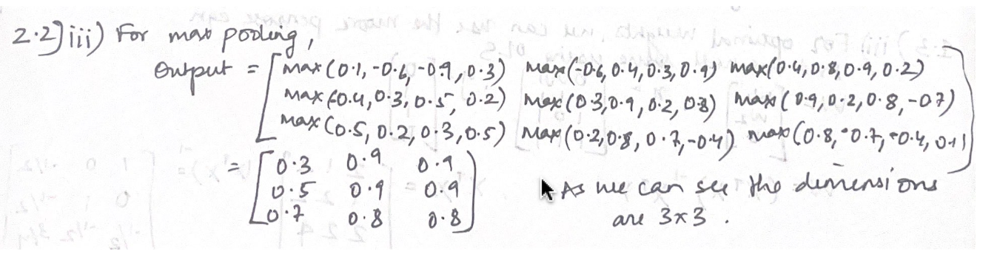

In [105]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/2.2.4.png")


**Answer for extra credit:**

Max-pooling is commonly used in Convolutional Neural Networks (CNNs) to decrease the spatial dimensions of the feature maps, resulting in improved network performance by mitigating overfitting, enhancing computational efficiency, and making the network more adaptable to translations and distortions in the input data. However, when a 2X2 convolution with a stride of 1 produces the same output size as the input size, max-pooling may not be necessary.

Despite this, max-pooling retains certain advantages over convolutional layers. For one, it is immune to small input translations, enhancing the network's resilience. Additionally, max-pooling can reduce the number of parameters in the network, leading to a decline in overfitting and improved computational efficiency.

Despite its benefits, max-pooling may not always be the best choice for a CNN. When the input data is noisy or highly distorted, max-pooling can inadvertently remove crucial information, leading to a decrease in accuracy. In these scenarios, it might be more suitable to use convolutional layers to decrease the size of the feature maps while preserving information. Additionally, for simple and small input data, like MNIST digits, max-pooling may not be necessary, and convolutional layers alone could be adequate for achieving high accuracy.

# Question 3

### 3.1 Identify True/False

i) In FGSM method, the parameters of the trained model change. -- **False**

ii) In FGSM method, the pixel values of input image changes. -- **True**

iii) FGSM can only be used for undirected adversarial attacks (An undirected adversarial attack is one in which the aim is to only perturb the original image in the direction of maximum loss. The attack does not care about which incorrect class the input example is classied into after perturbation). -- **False**

iv) PGD always nds points inside the threat model. -- **True**


### 3.2
#### i) It is given that 𝑥 = [2, 1] represents a cat. What is 𝑃𝑟(𝑥 = 𝑑𝑜𝑔) and 𝑃𝑟(𝑥 = 𝑐𝑎𝑡)?
#### ii) Now you want to change the components of x (i.e, change from [2,1] to something else) so that the probability of 𝑥1 being a cat decreases. However, you can only change x acc. to the threat model ||𝑥 − 𝑥1||𝑖𝑛𝑓 <= 0. 1. The threat model specifies the region in which the input 𝑥1 is allowed to vary. Plot the threat model on a 2-d graph and specify the co-ordinates of the corners of the quadrilateral thus formed.
#### iv) Perform an undirected attack to decrease the probability of 𝑥1 being a cat with the following step sizes : 0.001, 0.1, and 1. Perform the attack in 2 ways - first by using the sign of gradients, and second by using the actual values of gradients. Which of these FGSM attacks lies in the threat model?
#### v) Find a PGD attack using α: 0.01.
#### v) Perform a directed attack to increase the probability of 𝑥1 being a dog with the following step sizes : 0.001, 0.1, and 1. Perform the attack in 2 ways - first by using the sign of gradients, and second by using the actual values of gradients. Which of these attacks lies in the threat model?
#### vi) What are your observations from the results in (iv) and (v)?

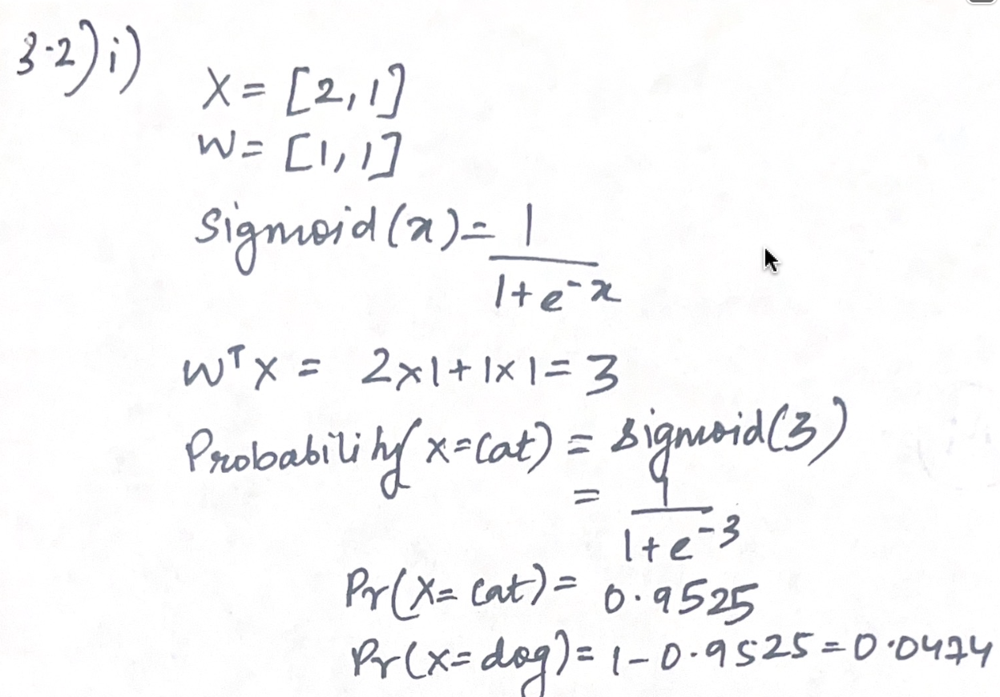

In [106]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/3.2.1.png")


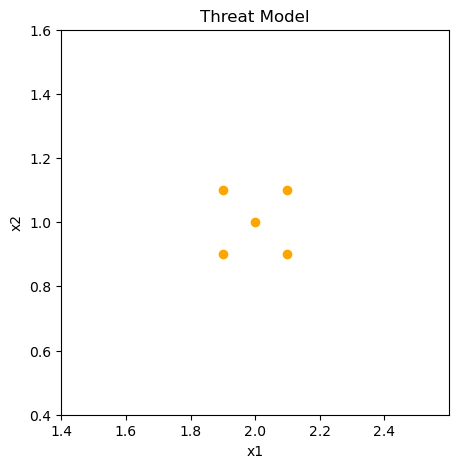

In [50]:
w = torch.tensor([1.0, 1.0])
x1 = torch.tensor([2.0, 1.0])
radius = 0.1

# corners of the quadrilateral
x2 = x1 + torch.tensor([radius, radius])
x3 = x1 + torch.tensor([radius, -radius])
x4 = x1 + torch.tensor([-radius, radius])
x5 = x1 + torch.tensor([-radius, -radius])

# plotting the threat model
plt.figure(figsize=(5,5))
plt.scatter([x1[0], x2[0], x3[0], x4[0], x5[0]], [x1[1], x2[1], x3[1], x4[1], x5[1]], color='orange')
plt.xlim(x1[0]-radius-0.5, x1[0]+radius+0.5)
plt.ylim(x1[1]-radius-0.5, x1[1]+radius+0.5)
plt.xlabel("x1")
plt.ylabel("x2")
plt.title("Threat Model")
plt.show()

In [51]:
print("The co-ordinates of the corners of the quadrilateral are",x2,x3,x4,x5)

The co-ordinates of the corners of the quadrilateral are tensor([2.1000, 1.1000]) tensor([2.1000, 0.9000]) tensor([1.9000, 1.1000]) tensor([1.9000, 0.9000])


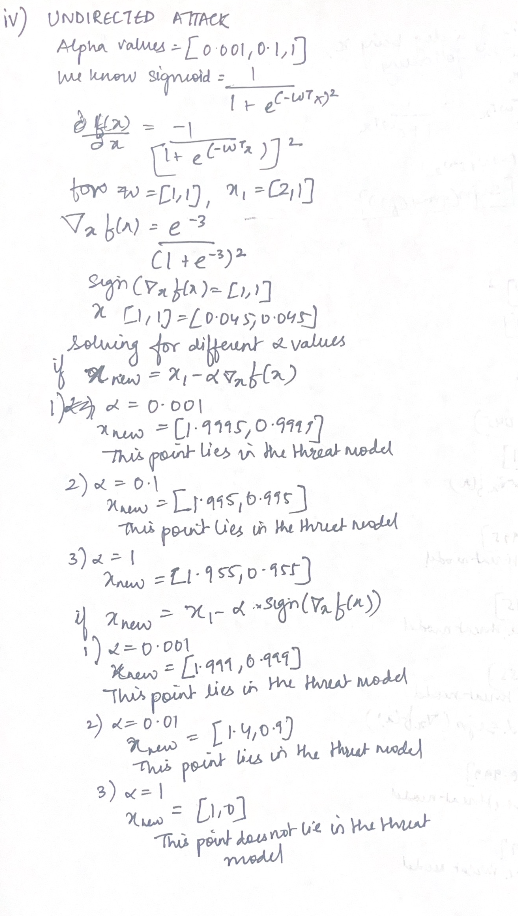

In [118]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/3.2.4.png")


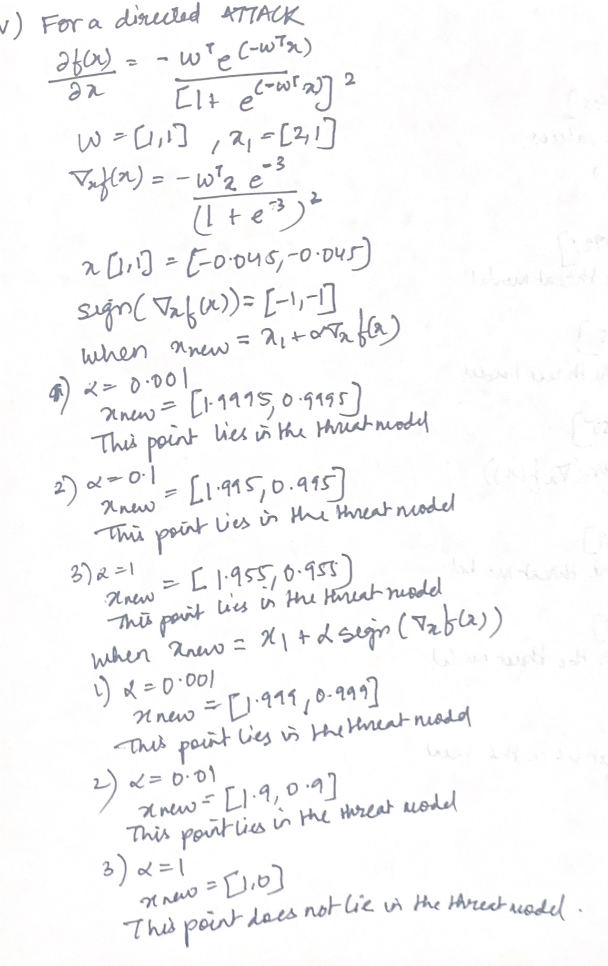

In [119]:
display.Image("https://raw.githubusercontent.com/GandhiDisha/Introduction-to-Deep-Learning-Course/main/Homework/images/3.2.5.png")


**Observations**

We can see clearly that there is not a huge difference between directed and undirected attacks. That might be because we just have two classes. 
The observations show that using gradient for all step sizes give us x values that lie in the threat model hinting towards the fact that old images are not significantly different from the new ones.
The signs permit us to attack strongly and we can see for one alpha value the new x value goes out of threat.